In [1]:
#hide
import matplotlib.pyplot as plt
from matplotlib import animation
import proplot as plot
plot.rc['figure.facecolor'] = 'white'
plot.rc['axes.grid'] = False
plot.rc['animation.html'] = 'jshtml'
plot.rc['savefig.dpi'] = 180

import sys
sys.path.append('/Users/46h/Research/code/accphys')
from tools.plotting import corner

# Computing matched envelopes
> A summary of my first peer-reviewed publication.
- author: Austin Hoover
- toc: true 
- badges: false
- comments: true
- image: images/corner.png
- categories: [accelerators, space charge, differential equations, publications]

My first peer-reviewed paper, titled [*Computation of the matched envelope of the Danilov distribution*](https://doi.org/10.1103/PhysRevAccelBeams.24.044201) {% cite Hoover2021 %}, was published in Physical Review Accelerators and Beams (PRAB) at the end of April. I thought I would summarize the results of the paper here. I probably ended up making this too long for anyone to be interested in reading all the way through (as usual), but oh well. The paper was on the topic of *self-consistent beams*; I'll start by defining this term.

## Self-consistent beams

### Definition and attractive properties

We define a beam to be self-consistent if it satisfies the following conditions:
1. It gives rise to linear space charge forces.
2. The above point remains true as long as all external forces are linear.

Let's discuss the meaning and relevance of these conditions. Space charge forces are the forces which arise between charged particles in a beam. *Linear* refers to the dependence of the magnitude of this force on the position in the beam. For example, consider the following two distributions of charged particles and the radial electric fields they produce.

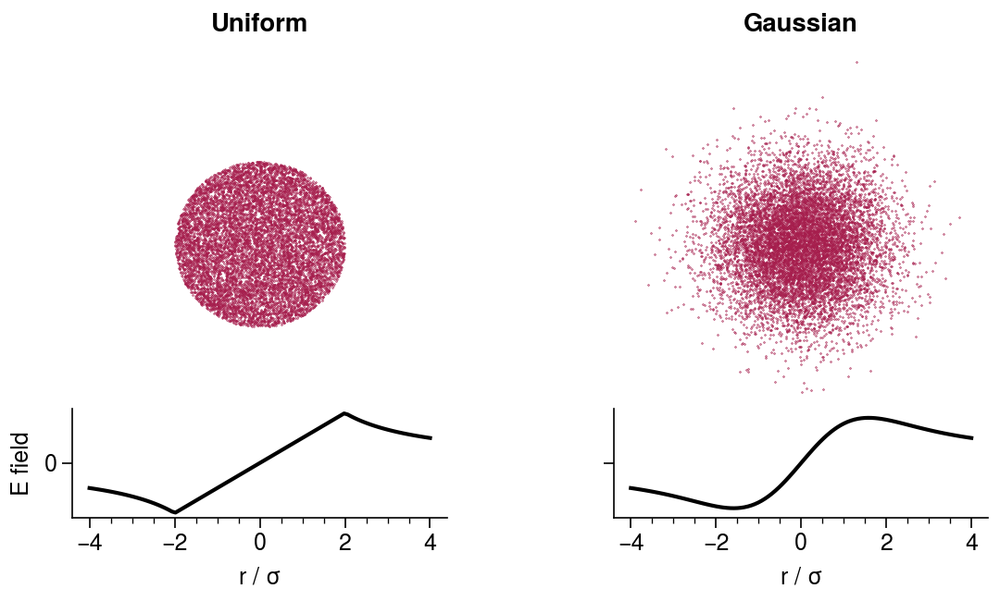

In [4]:
#collapse
import numpy as np
import matplotlib.pyplot as plt
import proplot as plot

# Generate 2D uniform density distribution
n = 10000
np.random.seed(6)
rho = 2 * np.sqrt(np.random.uniform(size=n))
phi = np.random.uniform(0, 2*np.pi, size=n)
X1 = np.vstack([rho * np.cos(phi), rho * np.sin(phi)]).T

# Generate 2D Gaussian distribution
X2 = np.random.normal(scale=1, size=(n, 2))

# Plot distributions
fig, axes = plot.subplots(nrows=2, ncols=2, figsize=(5.4, 3.25), hspace=0, wspace=0.9,
                          spany=False, spanx=False, aspect=1, height_ratios=[1, 0.3])
for ax, X in zip(axes[0, :], [X1, X2]):
    ax.scatter(X[:, 0], X[:, 1], s=0.05, c='pink9')
    for side in ['top', 'bottom', 'left', 'right']:
        ax.spines[side].set_visible(False)
axes[0, :].format(yticks=[], toplabels=['Uniform', 'Gaussian'])

# Plot radial electric field
def Efield(r, kind='gaussian'):
    if r == 0:
        return 0
    if kind == 'uniform':
        return r / 4 if abs(r) <= 2 else 1 / r
    elif kind == 'gaussian':
        return (1 / r) * (1 - np.exp(-0.5 * r**2))
    
xvals = np.linspace(-4, 4, 100)
axes[1, 0].plot(xvals, [Efield(x, 'uniform') for x in xvals], 'k-')
axes[1, 1].plot(xvals, [Efield(x, 'gaussian') for x in xvals], 'k-');
axes[1, :].format(ylabel='E field', yticks=[0], xlabel=r'r / $\sigma$')
for ax in axes[1, :]:
    for side in ['top', 'right']:
        ax.spines[side].set_visible(False)

The distribution on the left produces an electric field which is proportional to the radius, i.e., it gives rise to linear space charge forces (this isn't true outside $r = 2\sigma$, but no particles are in this region). On the other hand, the distribution on the right produces an electric field which depends nonlinearly on the radius, i.e., it gives rise to nonlinear space charge forces.

Nonlinear forces bring with them several negative effects. One of these is emittance growth. Emittance is a measure of the area occupied by the beam in phase space, so it measures both the spread in positions and the spread in velocities of the beam particles. Most of the time we are concerned with the horizontal emittance ($x$-$x'$) and the vertical emittance ($y$-$y'$). It's usually important to keep the emittance as small as possible; for instance, a smaller emittance leads to a larger luminosity in a collider. The key point here is that the emittance is only invariant if all forces are linear. Here is a simulation example showing emittance growth due to nonlinear space charge forces from {% cite Hofmann2017 %}. 

<img src=images_2021-05-13/fig7.png width=500>

Another effect of space charge in circular machines is called the *tune shift*. The single-particle tune is the number of oscillations a particle undergoes in phase space during one trip around the accelerator. Space charge decreases the tune of every particle, similar to how weakening a spring decreases the oscillation frequency of a mass attached to the spring. This is annoying because the tunes need to be precisely chosen to avoid [resonances](https://austin-hoover.github.io/blog/physics/accelerators/nonlinear%20systems/resonances/2021/03/28/nonlinear_resonances.html) driven by nonlinear magnetic fields. A common strategy is to avoid any resonance lines up to a certain order defined by $M_x \nu_x + M_y \nu_y = N$, where $\nu_x$ and $\nu_y$ are the horizontal and vertical tunes, $M_x$, $M_y$, and $N$ are integers, and $|M_x| + |M_y|$ is the order of the resonance; if a particle lies on one of these lines in tune space, it increases the chances that it will be driven to large amplitudes and eventually lost. So there is some extra work to ensure that the tune doesn't cross any low-order resonance lines as it shifts. But nonlinear forces cause the magnitude of the tune shift to depend on the particle's position; the beam then spreads out in tune space, increasing the chance that some particles will cross resonance lines. This puts a fundamental limit on the beam intensity. Here is an old simulation example in the SNS from {% cite Galambos1999 %}.

<img src=images_2021-05-13/fig6.png width=400>

A third downside of nonlinear space charge forces is a loss of analytic tractability. Space charge introduces the self-consistency problem: the collective electric field causes each particle to move, which then changes the collective field, which then moves the particles, and so on. In general, there is no analytic solution to this problem and we must turn to expensive computer simulations.

At this point it's (hopefully) clear that a beam with linear space charge forces would alleviate several problems. In fact, we already showed an example of such a beam. But if we took this beam and transported it through an accelerator; would its uniform density be maintained? To answer this question, we would need to specify the initial distribution of particle *velocities* in addition to the initial positions. It turns out that there are only a few special cases, which we call self-consistent beams, for which the answer is yes.

### KV distribution

The first self-consistent beam was derived by a pair of Russian scientists in 1959 and is known as the KV distribution. Particles in the KV distribution uniformly populate the boundary of an ellipsoid (or sphere in certain coordinates) in 4D phase space ($x$, $x'$, $y$, $y'$). I'm not going into the details here, but it's simlar to the microcanonical distribution from statistical mechancis. Interestingly, any 2D projection of the distribution is a uniform density ellipse; in particular, the $x$-$y$ distribution is an upright ellipse. There are a few ways to generate a uniform density on a 4D sphere, but the nicest way I've found is to first create a 4D Gaussian, then normalize all vectors to unit length.

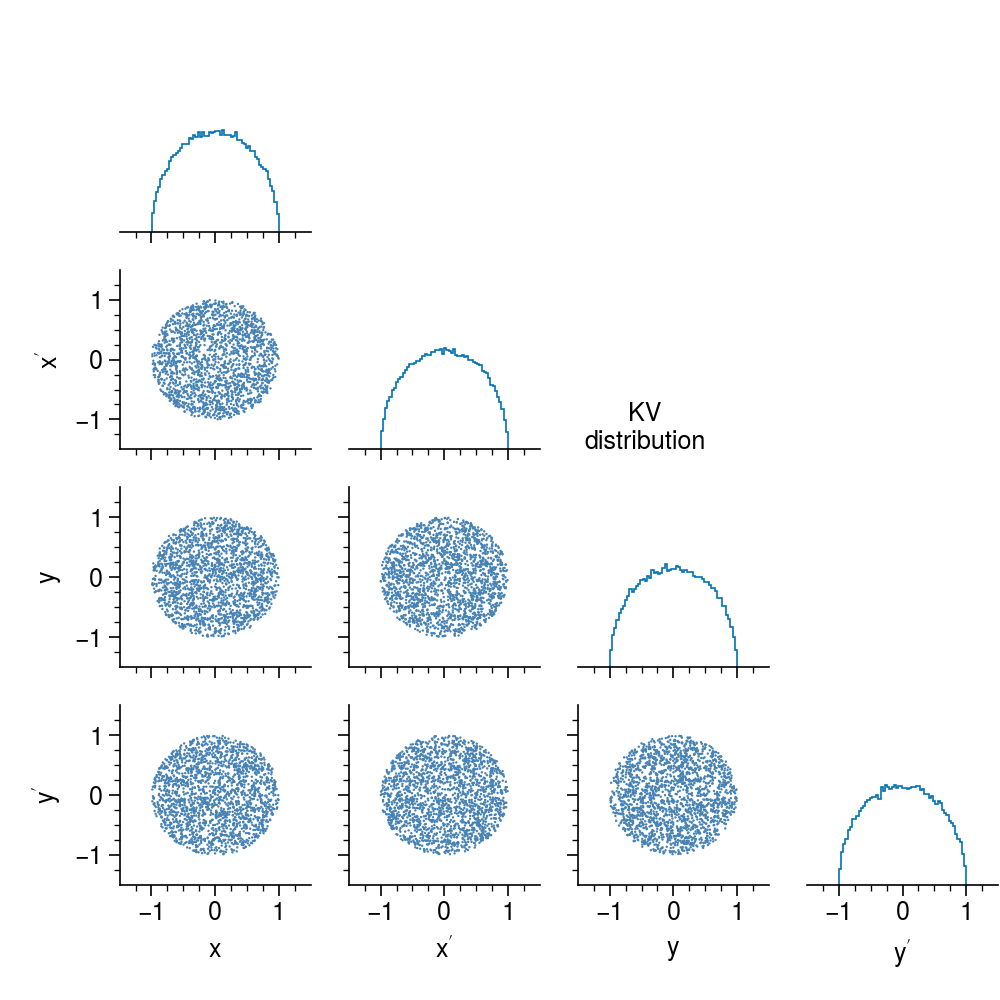

In [3]:
#collapse
X = np.random.normal(size=(100000, 4))
X = np.apply_along_axis(lambda x: x / np.linalg.norm(x), 1, X)

# https://github.com/austin-hoover/accphys/blob/master/tools/plotting.py
corner(X, figsize=5, units=None, text='KV\ndistribution');

The electric field within a uniform density, upright ellipse can (not easily) be shown to be 

$$ \mathbf{E}(x, y) \propto \frac{x}{c_x(c_x + c_y)}\hat{x} + \frac{y}{c_y(c_x + c_y)}\hat{y}, \tag{1}$$

where $c_x$ and $c_y$ are the semi-axes of the ellipse (I've left out a factor out front which contains the beam intensity). Notice that it's both linear and uncoupled, meaning that the $x$ component of the field is proportional to $x$. Using this field, a system of differential equations can be produced which evolve the beam *envelope*, the elliptical boundary containing the particles in the $x$-$y$ plane. The neat thing is that these equations close the feedback loop presented by the self-consistency problem; every change to the envelope is consistent with its own fields, even when the external fields are time-dependent. These envelope equations, as they're called, have been incredibly important for understanding space charge affects. In addition to providing a theoretical benchmark for computer simulations, the equations can capture the approximate behavior of more realistic beams in some cases (see the first figure in this post — the Gaussian has has an approximately uniform core). More details can be found in {% cite Lund2004 %}. Let's try integrating these equations in a FODO lattice.

In [4]:
#collapse
from scipy.integrate import odeint

def fodo(s, quad_strength=0.556, cell_length=5.0):
    s = (s % cell_length) / cell_length
    delta = 0.125
    if s < delta or s > 1 - delta:
        return +quad_strength
    elif 0.5 - delta <= s < 0.5 + delta:
        return -quad_strength
    return 0.0

def kv_derivs(params, s, Q, foc):
    cx, cxp, cy, cyp = params
    k0x = foc(s)
    k0y = -k0x
    w = np.zeros(4)
    w[0], w[2] = cxp, cyp
    w[1] = -k0x*cx + 2*Q/(cx+cy) + 16*epsx**2/(cx**3)
    w[3] = -k0y*cy + 2*Q/(cx+cy) + 16*epsy**2/(cy**3)
    return w
        
def track_kv(params, positions, Q, foc):
    tracked = odeint(kv_derivs, params, positions, args=(Q, foc))
    sizes = tracked[:, [0, 2]]
    return sizes * 1000 # convert to mm

# Create KV envelope
alphax, alphay, betax, betay = 0.0, 0.0, 8.017, 1.544
epsx = epsy = 10e-6
cx = 2 * np.sqrt(epsx * betax)
cy = 2 * np.sqrt(epsy * betay)
cxp = cyp = 0.0
params = [cx, cxp, cy, cyp]

# Integrate envelope equations
cell_length, periods, npts = 5.0, 4, 1000
positions = np.linspace(0, cell_length * periods, npts)
Q = 1e-5
sizes = track_kv(params, positions, Q, fodo)
sizes0 = track_kv(params, positions, 0.0, fodo)

In [5]:
#collapse
from matplotlib.patches import Ellipse

fps = 12
stride = 10
umax, umin = np.max(sizes), np.min(sizes)
umax_pad = 1.25 * umax

fig, axes = plot.subplots(nrows=2, ncols=2, figsize=(7, 2.5), 
                          spany=False, aligny=True, sharey=False, sharex=False,
                          hspace=0.2, height_ratios=[5, 1], width_ratios=[2.75, 1])
axes[0, 0].format(xlabel='', ylabel='Beam size [mm]', ylim=(umin - 5, umax + 5))
axes[1, 0].format(xlabel='s [m]', ylabel=r'$k_x$', yticks=[0], ylim=(-0.6116, 0.6116))
axes[:, 0].format(xlim=positions[[0, -1]])
axes[1, 0].spines['top'].set_visible(False)
axes[0, 1].format(xticklabels=[], yticklabels=[], xlabel='x', ylabel='y',
                  xlim=(-umax_pad, umax_pad), ylim=(-umax_pad, umax_pad))
for side in ['top', 'right']:
    axes[0, 1].spines[side].set_visible(False)
axes[1, 1].axis('off')
axes[0, 0].format(xticklabels=[])
plt.close()

line1, = axes[0, 0].plot([], [])
line2, = axes[0, 0].plot([], [])
axes[0, 0].format(cycle='colorblind')
line3, = axes[0, 0].plot([], [], ls='--', lw=0.5)
line4, = axes[0, 0].plot([], [], ls='--', lw=0.5)
axes[1, 0].plot(positions, [fodo(s) for s in positions], color='k', lw=1)

def update(i):
    i *= stride
    line1.set_data(positions[:i], sizes[:i, 0])
    line2.set_data(positions[:i], sizes[:i, 1])
    line3.set_data(positions[:i], sizes0[:i, 0])
    line4.set_data(positions[:i], sizes0[:i, 1])
    axes[0, 0].legend(labels=['x', 'y'], ncols=1, loc='upper left', 
                      fontsize='small', handlelength=1.5)
    for patch in axes[0, 1].patches:
        patch.set_visible(False)
    axes[0, 1].add_patch(Ellipse((0, 0), 2*sizes[i, 0], 2*sizes[i, 1], 
                                 fc='lightsteelblue', lw=0.75, ec='k'))
    axes[0, 1].add_patch(Ellipse((0, 0), 2*sizes0[i, 0], 2*sizes0[i, 1], fill=False, 
                                 ls='--', color='k', lw=0.5, alpha=0.5))
    
animation.FuncAnimation(fig, update, frames=len(positions[::stride]), interval=1000/fps)

On the top left, I've plotted the beam sizes with space charge (solid lines) and without space charge (dashed lines) as a function of the position $s$ in the lattice. The bottom plot shows the horizontal focusing strength; $k_x > 0$ is a focusing quadrupole, $k_x < 0$ is a defocusing quadrupole, and $k_x = 0$ is a drift. Notice, as I mentioned earlier, that the beam remains upright at all times. I should also mention that the horizontal and vertical emittances are invariants of the motion (more on that in a moment).

### Danilov distribution

For a while, it was assumed that the KV distribution is the only self-consistent beam when the lattice focusing is time-dependent; recently, however, a larger class of self-consistent beams were derived. One of these is the so-called *Danilov distribution*, which was the focus of this work. This beam is similar to the KV distribution in that it has a uniform particle density, but the main difference is that it has a nonzero angular momentum. Each particle in the beam satisfies

$$ x' = e_{11}x + e_{12}y, \tag{2}$$
$$ y' = e_{21}x + e_{22}y, $$

where the $e_{ij}$ terms are constants. Suppose $e_{11} = e_{22} = 0$ and $e_{21} = -e_{12} = 0$; this gives $y' = x$ and $x' = -y$, which describes a rotating rigid disk. Here are the phase space projections of the beam.

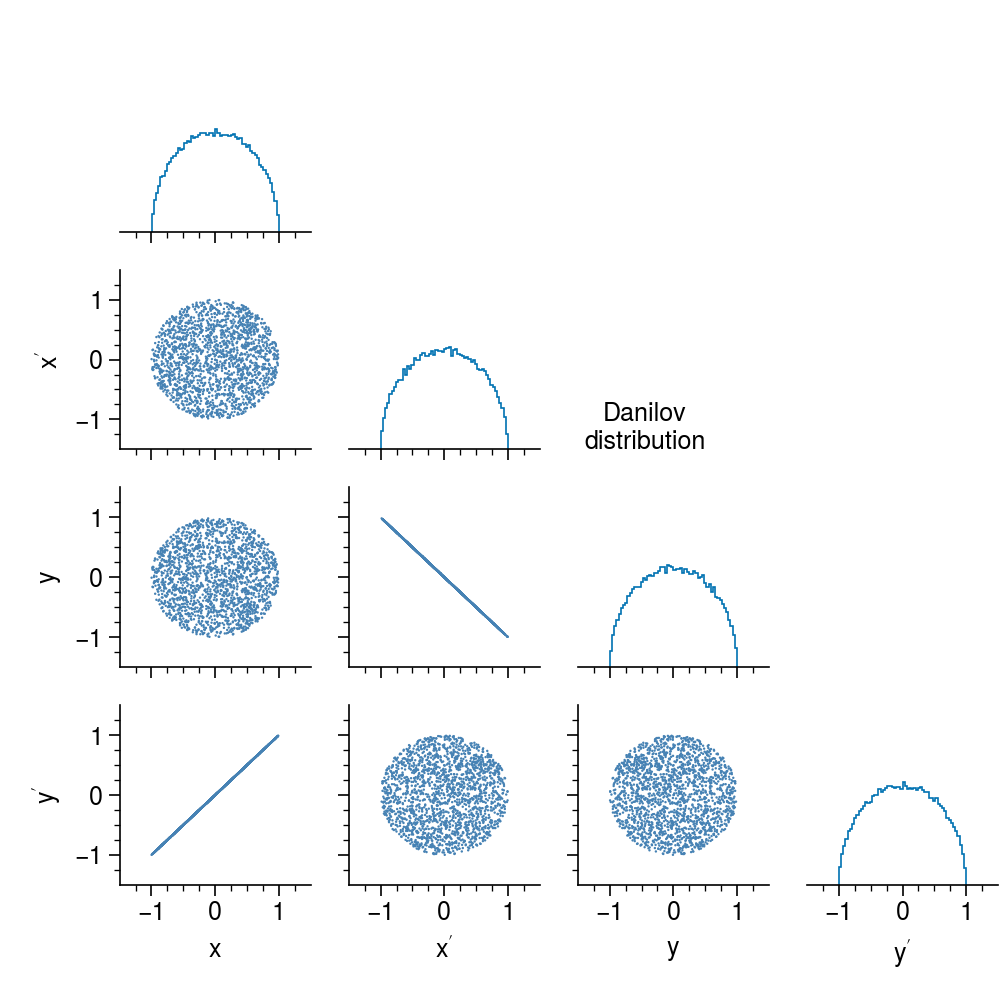

In [6]:
#collapse
X = np.random.normal(size=(100000, 4))
X = np.apply_along_axis(lambda x: x / np.linalg.norm(x), 1, X)
X[:, 3] = +X[:, 0]
X[:, 1] = -X[:, 2]
corner(X, figsize=5, units=None, text='Danilov\ndistribution');

We can again derive equations for the elliptical beam envelope, but now they're going to include coupling between $x$ and $y$. This is because tilting the ellipse from Eq. (1) produces a term proportional to $xy$ for the electric field. More details can be found in {%cite Danilov2003%}.

In [7]:
#collapse
def get_tilt_angle(a, b, e, f):
    return -0.5 * np.arctan2(2*(a*e + b*f), a**2 + b**2 - e**2 - f**2)

def get_radii(a, b, e, f):
    phi = get_tilt_angle(a, b, e, f)
    sin, cos = np.sin(phi), np.cos(phi)
    sin2, cos2 = sin**2, cos**2
    xx = a**2 + b**2
    yy = e**2 + f**2
    xy = a*e + b*f
    cx = np.sqrt(abs(xx*cos2 + yy*sin2 - 2*xy*sin*cos))
    cy = np.sqrt(abs(xx*sin2 + yy*cos2 + 2*xy*sin*cos))
    return cx, cy
    
def danilov_derivs(params, s, Q, foc):
    k0x = foc(s)
    k0y = -k0x
    a, b, ap, bp, e, f, ep, fp = params
    phi, (cx, cy) = get_tilt_angle(a, b, e, f), get_radii(a, b, e, f)
    cos, sin = np.cos(phi), np.sin(phi)
    cos2, sin2, sincos = cos**2, sin**2, sin * cos   
    T = 2 * Q / (cx + cy)
    w = np.zeros(8)
    w[0], w[1], w[4], w[5] = ap, bp, ep, fp
    w[2] = -k0x*a + T*((a*cos2 - e*sincos)/cx + (a*sin2 + e*sincos)/cy)
    w[3] = -k0x*b + T*((e*sin2 - a*sincos)/cx + (e*cos2 + a*sincos)/cy)
    w[6] = -k0y*e + T*((b*cos2 - f*sincos)/cx + (b*sin2 + f*sincos)/cy)
    w[7] = -k0y*f + T*((f*sin2 - b*sincos)/cx + (f*cos2 + b*sincos)/cy)
    return w

def track_danilov(params, positions, Q, foc):
    tracked = odeint(danilov_derivs, params, positions, args=(Q, foc))
    a, b, ap, bp, e, f, ep, fp = tracked.T
    xsizes = np.sqrt(a**2 + b**2)
    ysizes = np.sqrt(e**2 + f**2)
    sizes = np.vstack([xsizes, ysizes]).T * 1000
    cx, cy = get_radii(a, b, e, f)
    radii = np.vstack([cx, cy]).T * 1000
    angles = np.degrees(get_tilt_angle(a, b, e, f))
    return sizes, radii, angles
    
# (Calculated starting params offline to save space)
params = np.array([0.0179, 0.0, 0, 0.0022, 0, -0.0079, 0.0051, 0])
positions = np.linspace(0.0, 20.0, 1000)
sizes, radii, angles = track_danilov(params, positions, Q, fodo)
sizes0, radii0, angles0 = track_danilov(params, positions, 0.0, fodo)

In [8]:
#collapse
umax, umin = np.max(sizes), np.min(sizes)
umax_pad = 1.25 * umax

fig, axes = plot.subplots(nrows=2, ncols=2, figsize=(7, 2.5), 
                          spany=False, aligny=True, sharey=False, sharex=False,
                          hspace=0.2, height_ratios=[5, 1], width_ratios=[2.75, 1])
axes[0, 0].format(xlabel='', ylabel='Beam size [mm]', ylim=(umin - 5, umax + 5))
axes[1, 0].format(xlabel='s [m]', ylabel=r'$k_x$', yticks=[0], ylim=(-0.6116, 0.6116))
axes[:, 0].format(xlim=positions[[0, -1]])
axes[1, 0].spines['top'].set_visible(False)
axes[0, 1].format(xticklabels=[], yticklabels=[], xlabel='x', ylabel='y',
                  xlim=(-umax_pad, umax_pad), ylim=(-umax_pad, umax_pad))
for side in ['top', 'right']:
    axes[0, 1].spines[side].set_visible(False)
axes[1, 1].axis('off')
axes[0, 0].format(xticklabels=[])
plt.close()

line1, = axes[0, 0].plot([], [])
line2, = axes[0, 0].plot([], [])
axes[0, 0].format(cycle='colorblind')
line3, = axes[0, 0].plot([], [], ls='--', lw=0.5)
line4, = axes[0, 0].plot([], [], ls='--', lw=0.5)
axes[1, 0].plot(positions, [fodo(s) for s in positions], color='k', lw=1)

def update(i):
    i *= stride
    line1.set_data(positions[:i], sizes[:i, 0])
    line2.set_data(positions[:i], sizes[:i, 1])
    line3.set_data(positions[:i], sizes0[:i, 0])
    line4.set_data(positions[:i], sizes0[:i, 1])
    axes[0, 0].legend(labels=['x', 'y'], ncols=1, loc='upper left', 
                      fontsize='small', handlelength=1.5)
    for patch in axes[0, 1].patches:
        patch.set_visible(False)
    axes[0, 1].add_patch(Ellipse((0, 0), 2*radii[i, 0], 2*radii[i, 1], angles[i], 
                                 fc='lightsteelblue', lw=0.75, ec='k'))
    axes[0, 1].add_patch(Ellipse((0, 0), 2*radii0[i, 0], 2*radii0[i, 1], angles0[i], 
                                 fill=False, ls='--', color='k', lw=0.5, alpha=0.5))
    
animation.FuncAnimation(fig, update, frames=len(positions[::stride]), interval=1000/fps)

Notice that the beam tilts even without space charge. This has to do with the phase relationship between $x$ and $y$. When the beam is upright in the $x$-$y$ plane, $x$ and $y$ are 90 degrees out of phase (think of circular motion); on the other hand, a 0 or 180 degree phase difference would lead to a diagonal line in the $x$-$y$ plane and no correlations in $x$-$y'$ or $y$-$x'$. So, the beam is going to tilt any time the $x$ and $y$ phase are changed by unequal amounts. 

What is a bit less obvious is how space charge space charge affects the beam when it tilts. Although these forces are still linear, the $x$ and $y$ emittances are no longer conserved. Below is an example of a turn-by-turn plot (1 turn = 1 period = 5 meters in the above example) in  which there are two frequencies involved: a faster oscillation of the beam envelope, and a slower coupling oscilllation corresponding the emittance exchange.

<img src=images_2021-05-13/fig4.png width=500>

## Finding the matched beam 

I'll now move on to describing the problem that we addressed in the paper. Notice that the focusing in the above animations repeats itself after five meters; we call this the *period length*. A beam is *matched* to the lattice if its envelope repeats itself after one period length, or more precisely, its [covariance matrix](https://en.wikipedia.org/wiki/Covariance_matrix) repeats itself:

$$ \mathbf{\Sigma}(s + L) = \Sigma(s) \tag{3}$$

for all $s$, where $s$ is the position in the lattice, $L$ is the period length, and $\Sigma$ is the covariance matrix given by

$$\mathbf{\Sigma} = \begin{bmatrix}
    \langle{x^2}\rangle & \langle{xx'}\rangle & \langle{xy}\rangle & \langle{xy'}\rangle \\
    \langle{xx'}\rangle & \langle{x'^2}\rangle & \langle{yx'}\rangle & \langle{x'y'}\rangle \\
    \langle{xy}\rangle & \langle{yx'}\rangle & \langle{y^2}\rangle & \langle{yy'}\rangle \\
    \langle{xy'}\rangle & \langle{x'y'}\rangle & \langle{yy'}\rangle & \langle{y'^2}\rangle \\
\end{bmatrix} \tag{4}$$

(assuming all means are zero). So the matched beam has not only the same shape and orientation in $x$-$y$ space, but also the same spread in velocities and *correlations* between the positions and velocites. Finding the matched beam amounts to choosing the correct initial $\mathbf{\Sigma}$ such that Eq. (3) is satisfied. As I'll explain in a moment, the task is trivial without space charge but difficult with space charge. 

### Motivation 

There are a few reasons for computing this matched envelope. First, it's a sort of minimum energy solution, and this free energy can drive emittance growth in real beams. Second, it's the most radially compact solution for a given beam intensity, i.e., the maximum beam size is minimized. Multiple previous studies computed the matched envelope of the KV distribution as a first step in a stability analysis; the strategy is to check that perturbations around the matched solution are stable. There is also motivation related to an ongoing project to create an approximate Danilov distribution in the SNS, for which it would be nice to know the matched solution in the 250 meter long SNS storage ring. For all these reasons, we thought it was worthwhile to develop a method to compute the matched envelope of this beam. Our strategy was to do this in as simple a case as possible (FODO), but also to include some interesting effects such as splitting the lattice tunes or adding external coupling. 

### Challenges

There are two challenges to overcome. First, space charge causes the final beam to depend on the initial beam in a potentially complicated way which is unknown before tracking the beam; this is especially true for long lattices and large beam intensities. This just means we'll need to iterate to get the correct answer. The second challenge is knowing which beam parameters to vary. This is straightforward in the KV distribution since space charge doesn't couple $x$ and $y$, but it wasn't immediately clear how to do this when coupling is present.

### Solution

Consider the equation of motion for a particle in a coupled lattice:

$$ x'' + k_{11}(s)x + k_{13}(s)y + k_{14}(s)y' = 0, $$
$$ y'' + k_{31}(s)x + k_{33}(s)y + k_{23}(s)x' = 0. \tag{5}$$

Now, what does space charge do to these equations? For a tilted, uniform density ellipse, it simply modifies $k_{11}$, $k_{13}$, $k_{31}$, and $k_{33}$. Thus, we could replicate the effect of space charge by inserting a large number of linear defocusing elements into the lattice. We decided to call this new lattice the *effective lattice*. This is illustrated below.

![](images_2021-05-13/fig1.png)

The figure on the left is just showing how space charge is like a (possibly tilted) defocusing quadrupole in both planes. Notice that space charge causes $k_{13}$ to be nonzero, which shows that the system is coupled. We can think of the matched beam as generating an effective lattice which is periodic. The question then becomes which parameters to use to describe a coupled lattice... if we can do that, then we just vary those parameters to find the solution. There is actually no universally agreed upon method to describe coupled motion in beam physics; we used the one I wrote about in a [previous post](https://austin-hoover.github.io/blog/physics/accelerators/differential%20equations/2021/01/25/coupled_parametric_oscillators.html). I'll briefly comment on the application to this problem.

The following figure shows the turn-by-turn trajectory of a single particle in a coupled lattice.

![](images_2021-05-13/fig2.png)

The particle traces out a surface in 4D phase space consisting of points $\mathbf{x}_1$, $\mathbf{x}_2$, etc. We can create a matched beam by putting a particle at each of these points since the particles will just trade positions after a turn ($\mathbf{x}_i \rightarrow \mathbf{x}_{i+1}$). This can also be understood in terms of the eigenvectors of the one-turn transfer matrix; each particle can be written as a linear combination of these eigenvectors (shown in blue and red):

$$ \mathbf{x} = \sqrt{\varepsilon_1}\mathbf{v}_1e^{-i\psi_1} + \sqrt{\varepsilon_2}\mathbf{v}_2e^{-i\psi_2}. $$

The eigenvectors have amplitudes ($\varepsilon$) and phases ($\psi$), and a matched beam is formed by distributing particles along either or both of the eigenvectors with phases ranging uniformly between zero and $2\pi$. The ellipses traced out by the eigenvectors are described by the *4D Twiss parameters* $\alpha_{1x}$, $\beta_{1x}$, etc.

A key insight was that particles in the Danilov distribution only depend on one eigenvector; in other words, all the particles oscillate at the same frequency. There are more details on this in the paper, but the short story is that this cuts the number of parameters to six. There is the beam size in each dimension relative to the emittance, the beam divergence in each dimension relative to the emittance, the phase difference between $x$ and $y$ (this could go from 0 for a flat line or 90 degrees for an upright ellipse), and the ratio between the $x$ and $y$ emittances. We can also choose which eigenvector to use, so there are actually two different solutions. We wrap up all these parameters into a vector $\mathbf{p}$.

We can frame this as an optimization problem in which we search for the $\mathbf{p}$ which minimizes the sum of the squared differences between the initial and final moments when tracking through one period. We utilized two different optimization methods. The first was SciPy's [nonlinear least squares](https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.least_squares.html), which worked really well in most cases. The second strategy was to track the beam over a number of terms and compute the average of $\mathbf{p}$, then use that as the seed for the next round. This figure shows that method converging toward the solution after a few iterations. The relevant code is found [here](https://github.com/austin-hoover/py-orbit/blob/master/py/orbit/envelope/danilov.py).

![](images_2021-05-13/fig3.png)

## Example application

We demonstrated the matching routine in a FODO lattice, just like the one in the earlier animations. We also tried some variations like making the horizontal focusing stronger than the vertical, tilting the quadrupoles, and adding a longitudinal magnetic field. In the paper I write an analysis of each case, but I guess that would be a bit boring to include here. I can just show what the matched beam looks like instead. I'll also only look at one case: the simple FODO lattice. Here are the 2D phase space projections as a function of position.

<img src=images_2021-05-13/test.mov width=550 align=left>

The colors are for different beam intensities — the darkest curve is zero intensity and the brightest curve is the highest intensity. The main takeaway is that, although space charge seems to scale the size of the matched beam, the evolution looks quite similar. There are differences, however. Here are the x and y beam sizes, emittances, and the difference between the x and y phases ($\nu$).

<img src=images_2021-05-13/fig5.png width=200>

In the top two subplots, the dashed lines represent $y$ and the solid lines represent $x$. The difference that wasn't super evident in the animation is that the $x$ and $y$ emittances are oscillatory in the matched beam when space charge is turned on. The bottom plot sort of represents the roundness of the beam: $\nu$ = 0 or 180 degrees is a complete correlation between $x$ and $y$, while $\nu$ = 90 is no correlation. Space charge tends to pull these curves backtoward 90 degrees, which is apparent in the animation. Finally, I should note that there is another solution for the same lattice if we choose to use the other eigenvector; this solution rotates *clockwise*, but is otherwise the same. The scripts and analysis notebooks used to generate these plots, as well as the other plots in the paper, can be found on [GitHub](https://github.com/austin-hoover/accphys/tree/master/pyorbit/matching).

## Conclusion

Hopefully this gives a flavor of what went into this paper. Of course I've left out quite a bit, including a discussion of the relevance of the cases we tried. Although in the paper we argue that our findings could have an impact on future experiments (which is true), the paper can really stand on its own as a study of the envelope equations. 

I'm now working on a much more practical project — this is a relief because I can explain what I'm doing to people outside the field without rambling for minutes on end. We want to create an approximate Danilov distribution in the SNS and measure its covariance matrix (Eq. (4)). I'm specifically working on the measurement component.

**References**

{% bibliography --cited %}